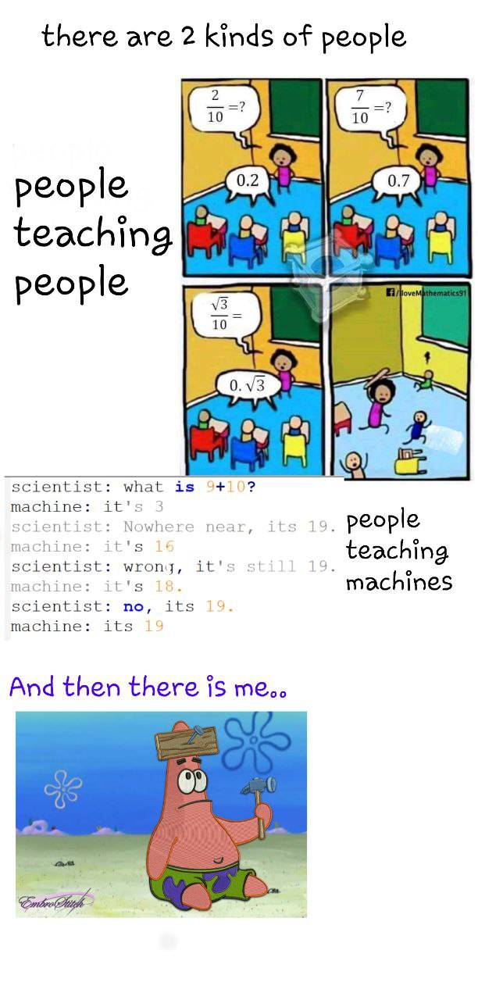

In [1]:
#install some packages
!pip install fuzzywuzzy
!pip install python-Levenshtein

# **Import Libraries and Packages**

In [2]:
#import packages and libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


from sklearn.model_selection import train_test_split,  GridSearchCV
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_predict
from statistics import mean, stdev
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import KFold,train_test_split,cross_val_score

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

import fuzzywuzzy
from fuzzywuzzy import process
import chardet

#Visualizing the Decision Tree
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

# Preprocessing and Cleaning The Training Data



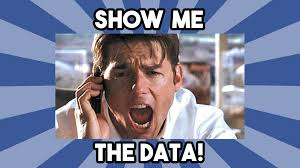

Load the data and print it and it's information to know anything about data

In [3]:
#Load the data
df = pd.read_csv("train_new.csv")

In [4]:
# print first five rows of the dataset
df.head()

,price,retail_price,currency_buyer,units_sold,uses_ad_boosts,rating,rating_count,badges_count,badge_local_product,badge_product_quality,badge_fast_shipping,tags,product_color,product_variation_size_id,product_variation_inventory,shipping_option_name,shipping_option_price,shipping_is_express,countries_shipped_to,inventory_total,has_urgency_banner,urgency_text,origin_country,merchant_title,merchant_name,merchant_info_subtitle,merchant_rating_count,merchant_rating,merchant_id,merchant_has_profile_picture,merchant_profile_picture,theme,crawl_month,id
0,8.00,7,EUR,10000,1,4.0,1670,0,0,0,0,"Summer,soildcolor,Plus Size,Tank,camisole,Tops...",yellow,M,50,Livraison standard,3,0,30,50,NaN,NaN,CN,keepahorse,keepahorse,"88 % avis positifs (66,644 notes)",66644,4.137582,577fb2b368116418674befd9,1,https://s3-us-west-1.amazonaws.com/sweeper-pro...,summer,2020-08,272
1,8.00,7,EUR,1000,0,4.0,843,1,1,0,0,"bathing suit,Plus Size,bikini set,sexy swimsui...",black,L,50,Livraison standard,3,0,37,50,NaN,NaN,CN,shanghaimingqidianqikejiyouxiangongsi,上海铭启电气科技有限公司,"91 % avis positifs (25,752 notes)",25752,4.256873,566a3ef17233ff2686443082,0,NaN,summer,2020-08,1515
2,6.00,34,EUR,100,0,4.0,10,0,0,0,0,"Summer,Vest,momshirt,Get,summer t-shirts,funny...",white,L,50,Livraison standard,2,0,41,50,NaN,NaN,CN,zhaodongmei,zhaodongmei,"83 % avis positifs (3,897 notes)",3897,3.928920,5aacd6c1ccf0c83e5a6f3de0,0,NaN,summer,2020-08,940
3,4.67,4,EUR,100,1,3.0,82,0,0,0,0,"Summer,Shorts,pants,Beach,Plus Size,beachpant,...",lakeblue,XS,5,Livraison standard,1,0,25,50,NaN,NaN,CN,pookie0331,pookie0331,"87 % avis positifs (7,497 notes)",7497,4.079365,583141fbfef4094e51453d9b,0,NaN,summer,2020-08,309
4,8.00,11,EUR,1000,0,4.0,127,0,0,0,0,"Summer,Floral print,women dresses,fashion dres...",apricot,S,50,Livraison standard,3,0,15,50,1.0,Quantité limitée !,CN,shitongyi12683626,shitongyi12683626,91 % avis positifs (173 notes),173,4.306358,5d3bc9f8e13a7e654424a4cb,0,NaN,summer,2020-08,226


In [5]:
# print all column headers + type + if there is null values or not
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1094 entries, 0 to 1093
Data columns (total 34 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   price                         1094 non-null   float64
 1   retail_price                  1094 non-null   int64  
 2   currency_buyer                1094 non-null   object 
 3   units_sold                    1094 non-null   int64  
 4   uses_ad_boosts                1094 non-null   int64  
 5   rating                        1094 non-null   float64
 6   rating_count                  1094 non-null   int64  
 7   badges_count                  1094 non-null   int64  
 8   badge_local_product           1094 non-null   int64  
 9   badge_product_quality         1094 non-null   int64  
 10  badge_fast_shipping           1094 non-null   int64  
 11  tags                          1094 non-null   object 
 12  product_color                 1065 non-null   object 
 13  pro

In [6]:
# checking for missing values for every feature
df.isnull().sum()

price                             0
retail_price                      0
currency_buyer                    0
units_sold                        0
uses_ad_boosts                    0
rating                            0
rating_count                      0
badges_count                      0
badge_local_product               0
badge_product_quality             0
badge_fast_shipping               0
tags                              0
product_color                    29
product_variation_size_id        12
product_variation_inventory       0
shipping_option_name              0
shipping_option_price             0
shipping_is_express               0
countries_shipped_to              0
inventory_total                   0
has_urgency_banner              745
urgency_text                    745
origin_country                   12
merchant_title                    0
merchant_name                     4
merchant_info_subtitle            0
merchant_rating_count             0
merchant_rating             

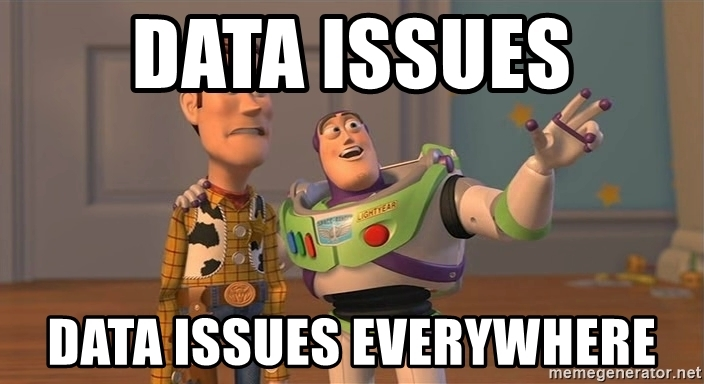

#handling the product_color feature

In [7]:
#checking the unique values to handle this feature
colors = df['product_color'].unique()
colors

array(['yellow', 'black', 'white', 'lakeblue', 'apricot', 'brown',
       'winered', 'blue', 'red', 'navyblue', 'green', 'khaki', 'White',
       'white & green', 'multicolor', 'lightpink', 'pink', 'RED',
       'armygreen', 'lightblue', nan, 'coffee', 'grey', 'skyblue',
       'watermelonred', 'pink & black', 'whitefloral', 'purple', 'navy',
       'pink & white', 'rosered', 'orange', 'Black', 'mintgreen',
       'leopardprint', 'gray', 'navy blue', 'star', 'rose', 'lightyellow',
       'camouflage', 'black & yellow', 'whitestripe', 'navyblue & white',
       'black & blue', 'lightred', 'violet', 'gold', 'black & green',
       'white & black', 'burgundy', 'black & white', 'lightgrey',
       'coolblack', 'lightgreen', 'beige', 'darkblue', 'darkgreen',
       'silver', 'wine red', 'Army green', 'pink & blue', 'rainbow',
       'claret', 'floral', 'brown & yellow', 'light green', 'Pink',
       'blue & pink', 'dustypink', 'camel', 'orange-red', 'rosegold',
       'ivory', 'fluorescentg

Virtualization for the data before handling to see the distribution of the data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


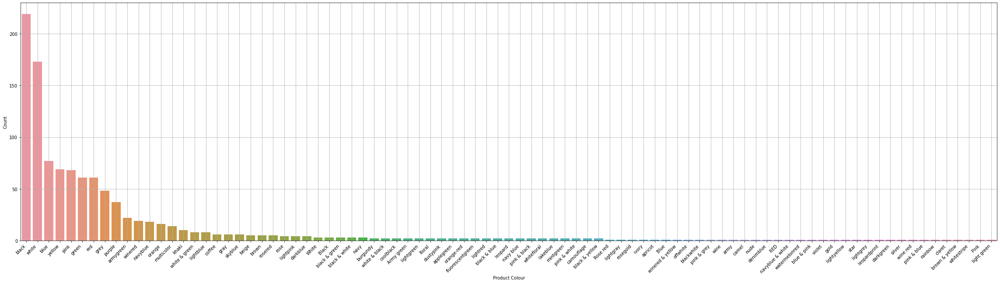

In [8]:
# checking for distribution of product_color before handling
fig, ax = plt.subplots(figsize = (40, 10))
sns.countplot('product_color', data = df, order = df['product_color'].value_counts().index, ax = ax)
ax.set(xlabel='Product Colour', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

In [9]:
#check every value to find the nearest values for it to convert to the base one
matches = fuzzywuzzy.process.extract("silver", colors, limit=15, scorer=fuzzywuzzy.fuzz.token_sort_ratio)
matches

[('silver', 100),
 ('ivory', 55),
 ('violet', 50),
 ('winered', 46),
 ('skyblue', 46),
 ('rosered', 46),
 ('leopard', 46),
 ('blue', 40),
 ('lightblue', 40),
 ('star', 40),
 ('rose', 40),
 ('wine', 40),
 ('denimblue', 40),
 ('Blue', 40),
 ('multicolor', 38)]

**handle the product_color column replace the similar colors with the parent color for them and the color i don't know them i but them 'other' as value for them**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


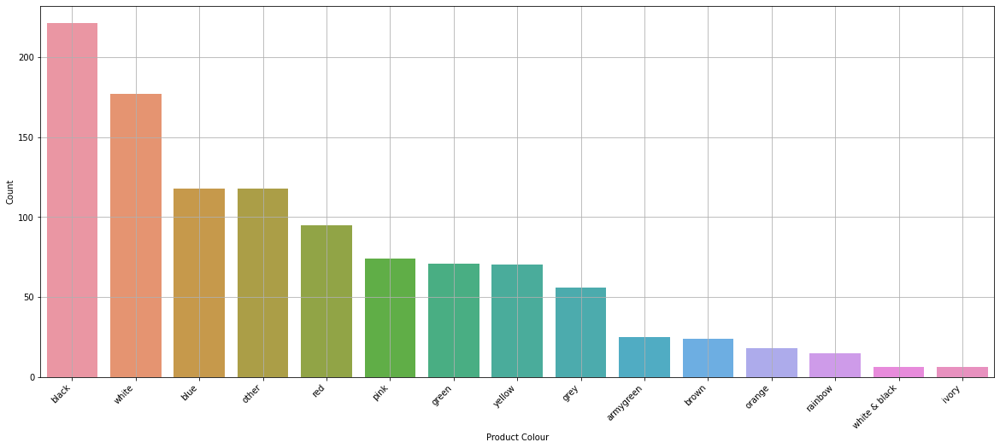

In [10]:
#replace the colors with the basic color for them 
df['product_color'].replace(['nude', 'khaki', 'coffee', 'camel', 'apricot'], 'brown', inplace = True)
df['product_color'].replace(['gray', 'lightgrey', 'lightgray'], 'grey', inplace = True)
df['product_color'].replace('blue & pink', 'pink & blue', inplace = True)
df['product_color'].replace('multicolor', 'rainbow', inplace = True)
df['product_color'].replace('beige', 'ivory', inplace = True)
df['product_color'].replace('coolblack', 'black', inplace = True)
df['product_color'].replace('leopardprint', 'leopard', inplace = True)
df['product_color'].replace('orange-red', 'orange', inplace = True)
df['product_color'].replace('lightyellow', 'yellow', inplace = True)
df['product_color'].replace(['skyblue', 'lakeblue', 'navyblue', 'darkblue', 'lightblue', 'navy blue', 'denimblue'], 'blue', inplace = True)
df['product_color'].replace(['whitefloral', 'offwhite', 'whitestripe'], 'white', inplace = True)
df['product_color'].replace(['lightpink', 'dustypink', 'whitestripe'], 'pink', inplace = True)
df['product_color'].replace(['blackwhite', 'black & white'], 'white & black', inplace = True)
df['product_color'].replace(['winered','rosered' ,'rose','lightred','wine red', 'burgundy','rose red', 'watermelonred'], 'red', inplace = True)
df['product_color'].replace(['army green', 'camouflage', 'army'], 'armygreen', inplace = True)
df['product_color'].replace(['mintgreen', 'darkgreen', 'lightgreen', 'applegreen', 'light green', 'fluorescentgreen'], 'green', inplace = True)


#create function to replace other colors didn't select in upper term with keyword 'other'
def handle_color(cName):
    if cName == 'brown' \
    or cName == 'grey' \
    or cName == 'rainbow' \
    or cName == 'ivory' \
    or cName == 'black' \
    or cName == 'orange' \
    or cName == 'yellow' \
    or cName == 'blue' \
    or cName == 'white'\
    or cName == 'pink'\
    or cName == 'white & black'\
    or cName == 'red'\
    or cName == 'armygreen'\
    or cName == 'green':
        return cName
    else:
        return "other"

#apply the function on the column to replace the values
df['product_color'] = df['product_color'].apply(handle_color)

# checking for distribution of product_color after handling
fig, ax = plt.subplots(figsize = (20, 8))
sns.countplot('product_color', data = df, order = df['product_color'].value_counts().index, ax = ax)
ax.set(xlabel='Product Colour', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the origin_country feature

Virtualization for the data before handling to see the distribution of the data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


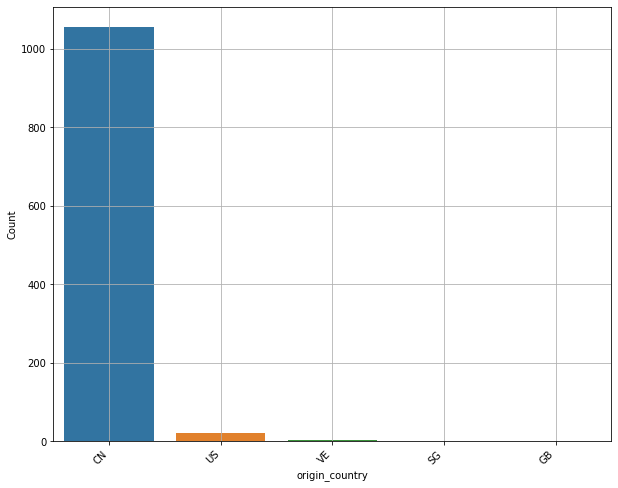

In [11]:
# checking for distribution of origin_country before handling
fig, ax = plt.subplots(figsize = (10, 8))
sns.countplot('origin_country', data = df, order = df['origin_country'].value_counts().index, ax = ax)
ax.set(xlabel='origin_country', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

**Handling the origin_country column by replace the values which has low rows with keyword 'other' and let 'CN' and 'US' values as them**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


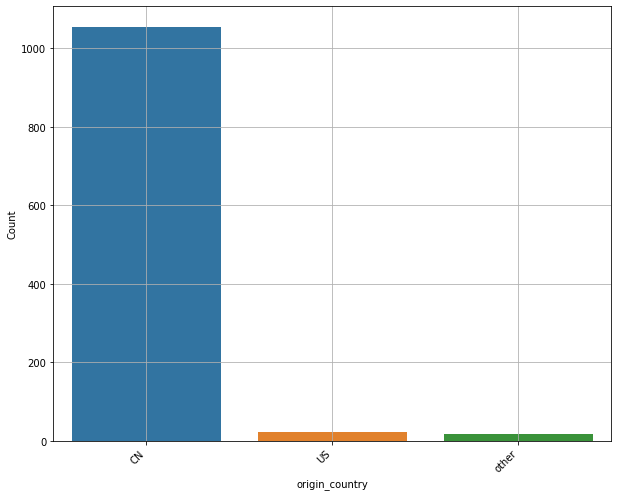

In [12]:
#create function to replace some of origin_country with keyword 'other'
def handle_origin_country(cName):
    if cName == 'CN' \
    or cName == 'US':
        return cName
    else:
        return "other"

#apply the function on the column to replace the values
df['origin_country'] = df['origin_country'].apply(handle_origin_country)


# checking for distribution of origin_country after handling
fig, ax = plt.subplots(figsize = (10, 8))
sns.countplot('origin_country', data = df, order = df['origin_country'].value_counts().index, ax = ax)
ax.set(xlabel='origin_country', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the product_variation_size_id feature

Virtualization for the data before handling to see the distribution of the data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


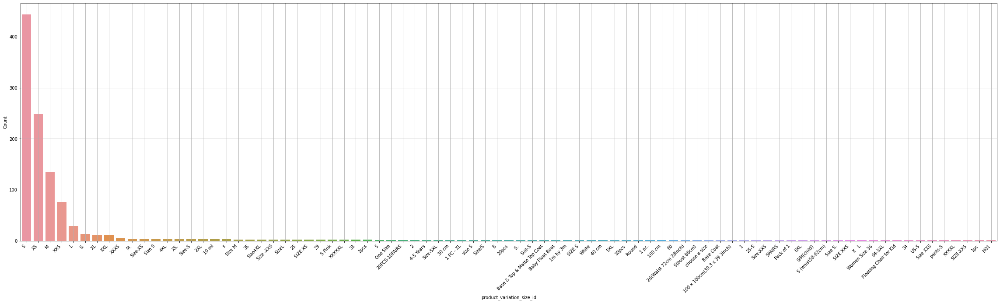

In [13]:
# checking for distribution of product_variation_size_id before handling
fig, ax = plt.subplots(figsize = (40, 10))
sns.countplot('product_variation_size_id', data = df, order = df['product_variation_size_id'].value_counts().index, ax = ax)
ax.set(xlabel='product_variation_size_id', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

**Handling the product_variation_size_id column by replace the values which has the same concept but written down in wrong value by the basic one for them and the values with low rows pr doesn't know with keyword 'other'**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


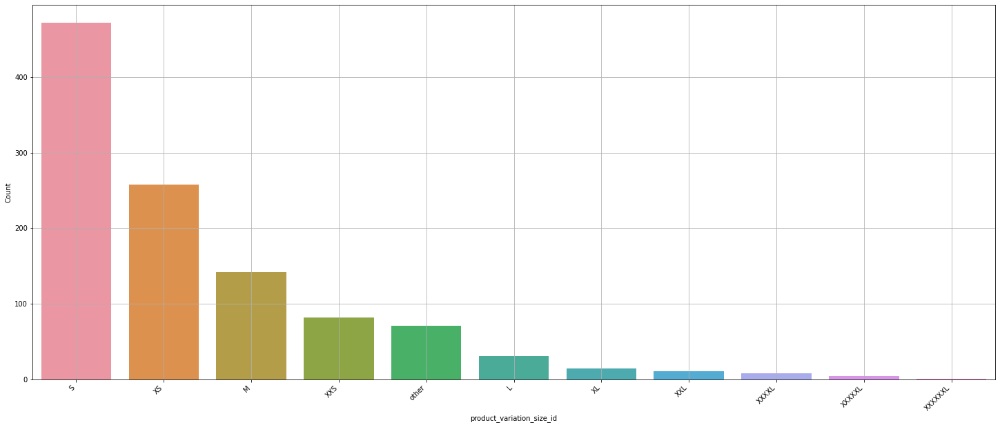

In [14]:
# Replacing different variations of sizes into one
df['product_variation_size_id'].replace(['S.','Size S','Size-S', 'Size S.','S..','Size/S','SIZE S', 's', 'size S'], 'S', inplace = True)
df['product_variation_size_id'].replace(['X   L','1 PC - XL'], 'XL', inplace = True)
df['product_variation_size_id'].replace(['Size-XXS','SIZE XXS','Size -XXS','SIZE-XXS', 'Size XXS'], 'XXS', inplace = True)
df['product_variation_size_id'].replace(['XS.','Size-XS','SIZE XS'], 'XS', inplace = True)
df['product_variation_size_id'].replace(['S/M(child)','M.','Size M'], 'M', inplace = True)
df['product_variation_size_id'].replace('SizeL', 'L', inplace = True)
df['product_variation_size_id'].replace('6XL', 'XXXXXXL', inplace = True)
df['product_variation_size_id'].replace(['Size-5XL','5XL'], 'XXXXXL', inplace = True)
df['product_variation_size_id'].replace(['04-3XL','4XL','Size4XL'], 'XXXXL', inplace = True)
df['product_variation_size_id'].replace('2XL ', 'XXL', inplace = True)

#create function to replace other size didn't select in upper term with keyword 'other'
def pr_var_id(name):
    if name == 'S' \
    or name == 'XL' \
    or name == 'XXS' \
    or name == 'XS' \
    or name == 'M' \
    or name == 'L' \
    or name == 'XXXXXXL' \
    or name == 'XXXXXL' \
    or name == 'XXXXL'\
    or name == 'XXL':
        return name
    else:
        return "other"

#apply the function on the column to replace the values
df['product_variation_size_id'] = df['product_variation_size_id'].apply(pr_var_id)

# checking for distribution of product_variation_size_id after handling
fig, ax = plt.subplots(figsize = (25, 10))
sns.countplot('product_variation_size_id', data = df, order = df['product_variation_size_id'].value_counts().index, ax = ax)
ax.set(xlabel='product_variation_size_id', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

In [15]:
#display the unique values on this column
df.product_variation_size_id.unique()

array(['M', 'L', 'XS', 'S', 'XL', 'other', 'XXS', 'XXL', 'XXXXL',
       'XXXXXXL', 'XXXXXL'], dtype=object)

#handling the units_sold feature

Virtualization for the data before handling to see the distribution of the data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


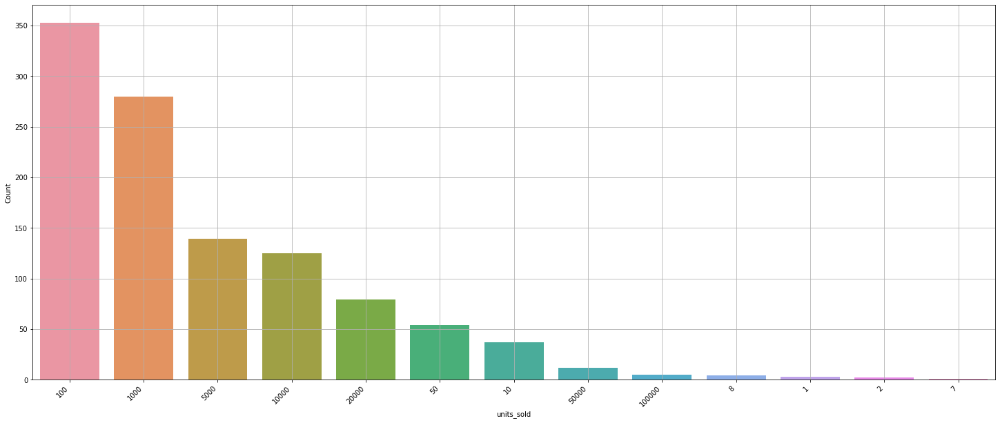

In [16]:
# checking for distribution of units sold before handling
fig, ax = plt.subplots(figsize = (25, 10))
sns.countplot('units_sold', data = df, order = df['units_sold'].value_counts().index, ax = ax)
ax.set(xlabel='units_sold', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

**Handling the units_sold column by replace the values which has value less than 10 to be 10 because this values have few rows so these values doesn't have a big effect on train the models and let the other has the same values**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


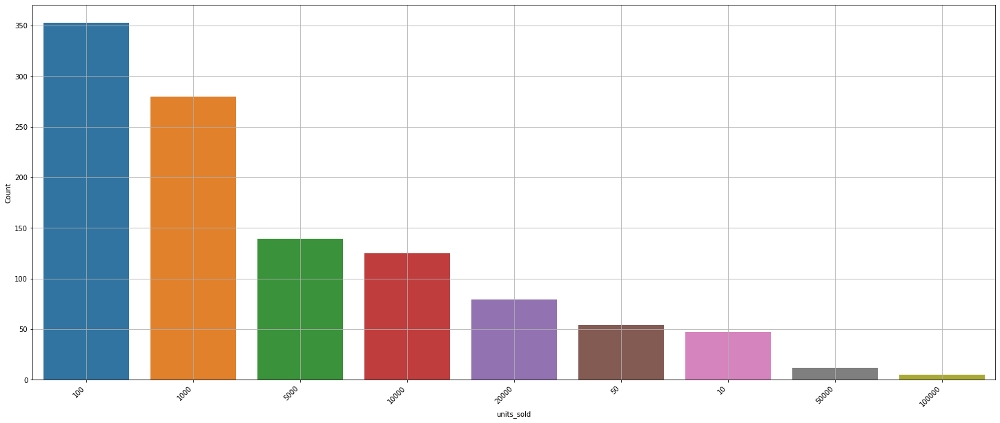

In [17]:
# checking for distribution of units sold 
df['units_sold'].value_counts()

# we have some units less than 10 so we're going to group them
def below_ten(units_sold):
    if units_sold < 10:
        return 10
    else:
        return units_sold

#apply the function on the column to replace the values
df['units_sold'] = df['units_sold'].apply(below_ten)

# checking for distribution of units sold to see if it correctly categorized everything
fig, ax = plt.subplots(figsize = (25, 10))
sns.countplot('units_sold', data = df, order = df['units_sold'].value_counts().index, ax = ax)
ax.set(xlabel='units_sold', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

In [18]:
# checking for missing values for every feature
df.isnull().sum()

price                             0
retail_price                      0
currency_buyer                    0
units_sold                        0
uses_ad_boosts                    0
rating                            0
rating_count                      0
badges_count                      0
badge_local_product               0
badge_product_quality             0
badge_fast_shipping               0
tags                              0
product_color                     0
product_variation_size_id         0
product_variation_inventory       0
shipping_option_name              0
shipping_option_price             0
shipping_is_express               0
countries_shipped_to              0
inventory_total                   0
has_urgency_banner              745
urgency_text                    745
origin_country                    0
merchant_title                    0
merchant_name                     4
merchant_info_subtitle            0
merchant_rating_count             0
merchant_rating             

#handling the has_urgency_banner feature

Virtualization for the data before handling to see the distribution of the data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


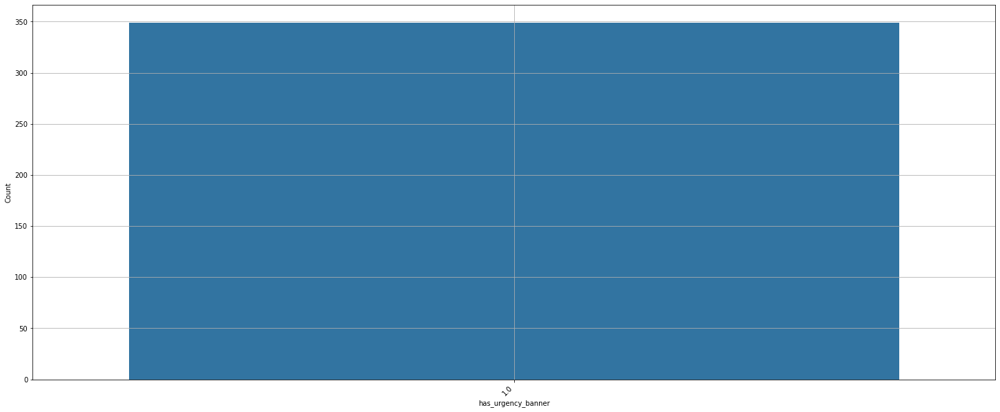

In [19]:
# checking for distribution of has_urgency_banner column befor handling
fig, ax = plt.subplots(figsize=(25, 10))
sns.countplot('has_urgency_banner', data = df, order = df['has_urgency_banner'].value_counts().index, ax = ax)
ax.set(xlabel='has_urgency_banner', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

**Handling has_urgency_banner column by fill all null values by '0' because if has urgency banner it's equal '1' so if hasn't urgency banner it will be '0'**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


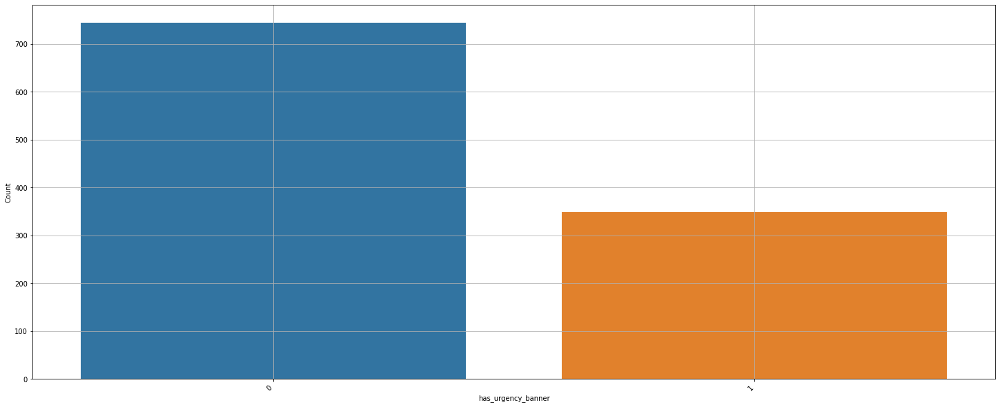

In [20]:
#fill nan values with 0
df['has_urgency_banner'].fillna(0, inplace=True)
#convert type of the column to be integer
df.has_urgency_banner = df.has_urgency_banner.astype(int)


# checking for distribution of has_urgency_banner column after handling
fig, ax = plt.subplots(figsize = (25, 10))
sns.countplot('has_urgency_banner', data = df, order = df['has_urgency_banner'].value_counts().index, ax = ax)
ax.set(xlabel='has_urgency_banner', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

In [21]:
# checking for missing values for every feature
df.isnull().sum()

price                             0
retail_price                      0
currency_buyer                    0
units_sold                        0
uses_ad_boosts                    0
rating                            0
rating_count                      0
badges_count                      0
badge_local_product               0
badge_product_quality             0
badge_fast_shipping               0
tags                              0
product_color                     0
product_variation_size_id         0
product_variation_inventory       0
shipping_option_name              0
shipping_option_price             0
shipping_is_express               0
countries_shipped_to              0
inventory_total                   0
has_urgency_banner                0
urgency_text                    745
origin_country                    0
merchant_title                    0
merchant_name                     4
merchant_info_subtitle            0
merchant_rating_count             0
merchant_rating             

#**Drop Features**



#1. drop the columns which i don't need them in trainning by trying them many times and didn't found any effect from them in train the models
#2.   and drop some of the features which has unique value


In [22]:
# checking for unique values for some feature
print(df.currency_buyer.unique())
print(df.theme.unique())
print(df.crawl_month.unique())

['EUR']
['summer']
['2020-08']


In [23]:
df.drop(['currency_buyer', 'theme','crawl_month', 'shipping_option_name','inventory_total','merchant_name','merchant_title','merchant_info_subtitle','id','merchant_profile_picture','urgency_text','countries_shipped_to','merchant_id','shipping_is_express','badge_local_product', 'tags'], axis=1, inplace=True)

as we see 

*   i droped **'currency_buyer', 'theme','crawl_month'** because all of them has unique values
* **'id'** not important in the training it's like index for the data
* **'tages'** when i added it didn't give me what i expect from this column so i droped it and get the same results
* and other columns didn't give me good results or improve my results and some times give me low performance and results so i droped them 

In [24]:
# checking for missing values for every feature
df.isnull().sum()

price                           0
retail_price                    0
units_sold                      0
uses_ad_boosts                  0
rating                          0
rating_count                    0
badges_count                    0
badge_product_quality           0
badge_fast_shipping             0
product_color                   0
product_variation_size_id       0
product_variation_inventory     0
shipping_option_price           0
has_urgency_banner              0
origin_country                  0
merchant_rating_count           0
merchant_rating                 0
merchant_has_profile_picture    0
dtype: int64

after all data preprocessing i did i will fill any nan value with fill forward method

In [25]:
#fill any nan value with fill forward method
df.fillna(method = 'ffill')

,price,retail_price,units_sold,uses_ad_boosts,rating,rating_count,badges_count,badge_product_quality,badge_fast_shipping,product_color,product_variation_size_id,product_variation_inventory,shipping_option_price,has_urgency_banner,origin_country,merchant_rating_count,merchant_rating,merchant_has_profile_picture
0,8.00,7,10000,1,4.0,1670,0,0,0,yellow,M,50,3,0,CN,66644,4.137582,1
1,8.00,7,1000,0,4.0,843,1,0,0,black,L,50,3,0,CN,25752,4.256873,0
2,6.00,34,100,0,4.0,10,0,0,0,white,L,50,2,0,CN,3897,3.928920,0
3,4.67,4,100,1,3.0,82,0,0,0,blue,XS,5,1,0,CN,7497,4.079365,0
4,8.00,11,1000,0,4.0,127,0,0,0,brown,S,50,3,1,CN,173,4.306358,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089,4.00,4,10000,0,4.0,2150,0,0,0,red,S,50,1,0,CN,230951,4.311066,0
1090,5.00,5,1000,0,5.0,377,1,1,0,other,other,31,2,0,CN,2904,4.422521,0
1091,9.00,48,1000,1,4.0,135,0,0,0,other,M,50,3,0,CN,6632,3.748794,0
1092,11.00,10,10000,1,4.0,1479,0,0,0,black,M,50,2,1,CN,5816,3.936382,0


#drop the rows which has null values

In [26]:
df.dropna(axis='rows', inplace = True)
df.shape

(1094, 18)

## Hot Encoding all Categorical data 

one hot encoding just convert each categorical feature to many columns contains 0s and 1s

In [27]:
#split the dataFrame to features and target
# copy the data frame into X_h then i drop 'rating' column to get the features which i will train the with them
X_h = df.iloc[:, :]
X_h = X_h.drop('rating', axis=1)
print(X_h.shape)

#one Hot Encoding the categorical data
one_hot = pd.get_dummies(X_h , columns = ['origin_country','product_variation_size_id','product_color'])
X_h = one_hot 

(1094, 17)


In [28]:
#convert all data type of features to float
X_h = X_h.astype(float, copy=True, errors='raise')
print(X_h.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1094 entries, 0 to 1093
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   price                              1094 non-null   float64
 1   retail_price                       1094 non-null   float64
 2   units_sold                         1094 non-null   float64
 3   uses_ad_boosts                     1094 non-null   float64
 4   rating_count                       1094 non-null   float64
 5   badges_count                       1094 non-null   float64
 6   badge_product_quality              1094 non-null   float64
 7   badge_fast_shipping                1094 non-null   float64
 8   product_variation_inventory        1094 non-null   float64
 9   shipping_option_price              1094 non-null   float64
 10  has_urgency_banner                 1094 non-null   float64
 11  merchant_rating_count              1094 non-null   float

In [29]:
#display the first 5 rowes of features after hot encoding
X_h

,price,retail_price,units_sold,uses_ad_boosts,rating_count,badges_count,badge_product_quality,badge_fast_shipping,product_variation_inventory,shipping_option_price,has_urgency_banner,merchant_rating_count,merchant_rating,merchant_has_profile_picture,origin_country_CN,origin_country_US,origin_country_other,product_variation_size_id_L,product_variation_size_id_M,product_variation_size_id_S,product_variation_size_id_XL,product_variation_size_id_XS,product_variation_size_id_XXL,product_variation_size_id_XXS,product_variation_size_id_XXXXL,product_variation_size_id_XXXXXL,product_variation_size_id_XXXXXXL,product_variation_size_id_other,product_color_armygreen,product_color_black,product_color_blue,product_color_brown,product_color_green,product_color_grey,product_color_ivory,product_color_orange,product_color_other,product_color_pink,product_color_rainbow,product_color_red,product_color_white,product_color_white & black,product_color_yellow
0,8.00,7.0,10000.0,1.0,1670.0,0.0,0.0,0.0,50.0,3.0,0.0,66644.0,4.137582,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,8.00,7.0,1000.0,0.0,843.0,1.0,0.0,0.0,50.0,3.0,0.0,25752.0,4.256873,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6.00,34.0,100.0,0.0,10.0,0.0,0.0,0.0,50.0,2.0,0.0,3897.0,3.928920,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,4.67,4.0,100.0,1.0,82.0,0.0,0.0,0.0,5.0,1.0,0.0,7497.0,4.079365,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,8.00,11.0,1000.0,0.0,127.0,0.0,0.0,0.0,50.0,3.0,1.0,173.0,4.306358,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089,4.00,4.0,10000.0,0.0,2150.0,0.0,0.0,0.0,50.0,1.0,0.0,230951.0,4.311066,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1090,5.00,5.0,1000.0,0.0,377.0,1.0,1.0,0.0,31.0,2.0,0.0,2904.0,4.422521,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1091,9.00,48.0,1000.0,1.0,135.0,0.0,0.0,0.0,50.0,3.0,0.0,6632.0,3.748794,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1092,11.00,10.0,10000.0,1.0,1479.0,0.0,0.0,0.0,50.0,2.0,1.0,5816.0,3.936382,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Encode all Categorical data into numbers to can deal with them

In [30]:
dict_categorical = {} # dictionary used to store categorical column encodings


# columns that are of categorical value
categorical_cols = df.columns[df.dtypes==object].to_list()



def categorical_to_digit(col):  
    # build the mapping
    encoded = col.astype('category').cat.codes
    # store the mapping
    dict_categorical[col.name] = dict(zip(np.asarray(col), np.asarray(encoded)))
    return encoded

# for each categorical feature, apply cat_digit where we build the mapping and transform the data
# this is for the training set (where we build the mapping)
df[categorical_cols] = df[categorical_cols].apply(lambda col: categorical_to_digit(col))
df = df.fillna(-1)

In [31]:
#split the dataFrame to features and target after encoding
# copy the data frame into X_c then i drop 'rating' column to get the features which i will train the with them
X_C = df.iloc[:, :]
X_C= X_C.drop('rating', axis=1)
X_C.shape

(1094, 17)

In [32]:
X_C

,price,retail_price,units_sold,uses_ad_boosts,rating_count,badges_count,badge_product_quality,badge_fast_shipping,product_color,product_variation_size_id,product_variation_inventory,shipping_option_price,has_urgency_banner,origin_country,merchant_rating_count,merchant_rating,merchant_has_profile_picture
0,8.00,7,10000,1,1670,0,0,0,14,1,50,3,0,0,66644,4.137582,1
1,8.00,7,1000,0,843,1,0,0,1,0,50,3,0,0,25752,4.256873,0
2,6.00,34,100,0,10,0,0,0,12,0,50,2,0,0,3897,3.928920,0
3,4.67,4,100,1,82,0,0,0,2,4,5,1,0,0,7497,4.079365,0
4,8.00,11,1000,0,127,0,0,0,3,2,50,3,1,0,173,4.306358,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089,4.00,4,10000,0,2150,0,0,0,11,2,50,1,0,0,230951,4.311066,0
1090,5.00,5,1000,0,377,1,1,0,8,10,31,2,0,0,2904,4.422521,0
1091,9.00,48,1000,1,135,0,0,0,8,1,50,3,0,0,6632,3.748794,0
1092,11.00,10,10000,1,1479,0,0,0,1,1,50,2,1,0,5816,3.936382,0


In [33]:
#split the 'Target data' from the dataframe 
Y = df['rating']
Y.shape

(1094,)

In [34]:
#splite the data into Train and Test by 84% for training to 10% for testing by using Hot encoding data
xTrain, xTest, yTrain, yTest = train_test_split(X_h, Y, test_size = .1, random_state = 42, shuffle = True)
print(xTrain.shape)
print(xTest.shape)
print(yTrain.shape)
print(yTest.shape)

(984, 43)
(110, 43)
(984,)
(110,)


In [35]:
#splite the data into Train and Test by 84% for training to 10% for testing by using categorical encoding
xTrain_c, xTest_c, yTrain_c, yTest_c = train_test_split(X_C, Y, test_size = .1, random_state = 42, shuffle = True)
print(xTrain_c.shape)
print(xTest_c.shape)
print(yTrain_c.shape)
print(yTest_c.shape)

(984, 17)
(110, 17)
(984,)
(110,)


# Preprocessing and Cleaning The testing Data

do what i did on the training data to have the same features and same data type when i test the models

In [36]:
#Load the data
dft = pd.read_csv("test_new.csv")

In [37]:
# print first five rows of the dataset
dft.head()

,price,retail_price,currency_buyer,units_sold,uses_ad_boosts,rating_count,badges_count,badge_local_product,badge_product_quality,badge_fast_shipping,tags,product_color,product_variation_size_id,product_variation_inventory,shipping_option_name,shipping_option_price,shipping_is_express,countries_shipped_to,inventory_total,has_urgency_banner,urgency_text,origin_country,merchant_title,merchant_name,merchant_info_subtitle,merchant_rating_count,merchant_rating,merchant_id,merchant_has_profile_picture,merchant_profile_picture,theme,crawl_month,id
0,5.75,5,EUR,10,1,0,0,0,0,0,"Funny,letter print,Fashion,Shirt,Sleeve,Summer...",white,XS,5,Livraison standard,2,0,139,50,NaN,NaN,CN,liyang163,liyang163,33 % avis positifs (3 notes),3,2.333333,5e63469b2fdc774466e15dd5,0,NaN,summer,2020-08,937
1,7.00,7,EUR,5000,0,579,0,0,0,0,"Women Vest,Vest,Fashion,Women Blouse,long dres...",black,XS,50,Livraison standard,2,0,31,50,NaN,NaN,CN,singing the song,singingthesong,"86 % avis positifs (4,213 notes)",4213,4.058391,583547f417dc6224cb464117,0,NaN,summer,2020-08,270
2,5.00,16,EUR,1000,1,62,0,0,0,0,"hollowouttanktop,Tanktops for women,Plus Size,...",blue,XS,20,Livraison standard,2,0,41,50,NaN,NaN,CN,Surper boutique,surperboutique,"85 % avis positifs (10,501 notes)",10501,4.029235,57086fd7fa6bee434d0e5852,0,NaN,summer,2020-08,308
3,18.00,27,EUR,5000,1,1903,0,0,0,0,"men jeans,Shorts,Summer,Vintage,Denim,Men,casu...",blue,M,50,Livraison standard,5,0,42,50,NaN,NaN,CN,postonny,postonny,"86 % avis positifs (15,855 notes)",15855,4.052917,5a17b55d1f4d8c4f0b44b0ce,0,NaN,summer,2020-08,913
4,12.00,81,EUR,20000,0,1799,0,0,0,0,"Shorts,Lace,pants,Dress,Women Leggings,Hot pan...",white,M,50,Livraison standard,3,0,38,50,NaN,NaN,CN,fashionforgirls,guangzhouchanny,"88 % avis positifs (151,914 notes)",151914,4.127921,53aa664438d3046ee44a5024,0,NaN,summer,2020-08,403


In [38]:
# print all column headers + type + if there is null values or not
dft.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   price                         479 non-null    float64
 1   retail_price                  479 non-null    int64  
 2   currency_buyer                479 non-null    object 
 3   units_sold                    479 non-null    int64  
 4   uses_ad_boosts                479 non-null    int64  
 5   rating_count                  479 non-null    int64  
 6   badges_count                  479 non-null    int64  
 7   badge_local_product           479 non-null    int64  
 8   badge_product_quality         479 non-null    int64  
 9   badge_fast_shipping           479 non-null    int64  
 10  tags                          479 non-null    object 
 11  product_color                 467 non-null    object 
 12  product_variation_size_id     477 non-null    object 
 13  produ

In [39]:
# checking for missing values for every feature
df.isnull().sum()

price                           0
retail_price                    0
units_sold                      0
uses_ad_boosts                  0
rating                          0
rating_count                    0
badges_count                    0
badge_product_quality           0
badge_fast_shipping             0
product_color                   0
product_variation_size_id       0
product_variation_inventory     0
shipping_option_price           0
has_urgency_banner              0
origin_country                  0
merchant_rating_count           0
merchant_rating                 0
merchant_has_profile_picture    0
dtype: int64

#handling the product_color feature

**handle the product_color column replace the similar colors with the parent color for them and the color i don't know them i but them 'other' as value for them**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


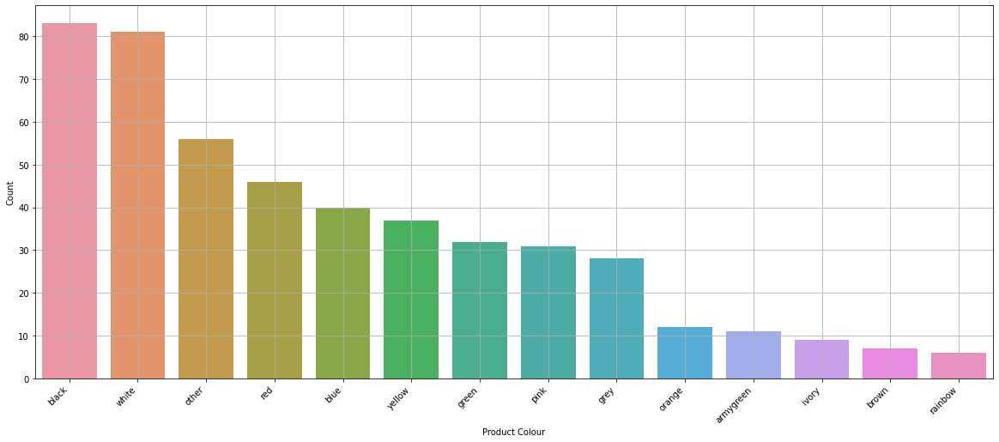

In [40]:
#replace the colors with the basic color for them 
dft['product_color'].replace(['nude', 'khaki', 'coffee', 'camel', 'apricot'], 'brown', inplace = True)
dft['product_color'].replace(['gray', 'lightgrey', 'lightgray'], 'grey', inplace = True)
dft['product_color'].replace('blue & pink', 'pink & blue', inplace = True)
dft['product_color'].replace('multicolor', 'rainbow', inplace = True)
dft['product_color'].replace('beige', 'ivory', inplace = True)
dft['product_color'].replace('coolblack', 'black', inplace = True)
dft['product_color'].replace('leopardprint', 'leopard', inplace = True)
dft['product_color'].replace('orange-red', 'orange', inplace = True)
dft['product_color'].replace('lightyellow', 'yellow', inplace = True)
dft['product_color'].replace(['skyblue', 'lakeblue', 'navyblue', 'darkblue', 'lightblue', 'navy blue', 'denimblue'], 'blue', inplace = True)
dft['product_color'].replace(['whitefloral', 'offwhite', 'whitestripe'], 'white', inplace = True)
dft['product_color'].replace(['lightpink', 'dustypink', 'whitestripe'], 'pink', inplace = True)
dft['product_color'].replace(['blackwhite', 'black & white'], 'white & black', inplace = True)
dft['product_color'].replace(['winered','rosered' ,'rose','lightred','wine red', 'burgundy','rose red', 'watermelonred'], 'red', inplace = True)
dft['product_color'].replace(['army green', 'camouflage', 'army'], 'armygreen', inplace = True)
dft['product_color'].replace(['mintgreen', 'darkgreen', 'lightgreen', 'applegreen', 'light green', 'fluorescentgreen'], 'green', inplace = True)


#create function to replace other colors didn't select in upper term with keyword 'other'
def handle_color(cName):
    if cName == 'brown' \
    or cName == 'grey' \
    or cName == 'rainbow' \
    or cName == 'ivory' \
    or cName == 'black' \
    or cName == 'orange' \
    or cName == 'yellow' \
    or cName == 'blue' \
    or cName == 'white'\
    or cName == 'pink'\
    or cName == 'white & black'\
    or cName == 'red'\
    or cName == 'armygreen'\
    or cName == 'green':
        return cName
    else:
        return "other"

#apply the function on the column to replace the values
dft['product_color'] = dft['product_color'].apply(handle_color)

# checking for distribution of product_color after handling
fig, ax = plt.subplots(figsize = (20, 8))
sns.countplot('product_color', data = dft, order = dft['product_color'].value_counts().index, ax = ax)
ax.set(xlabel='Product Colour', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the origin_country feature

**Handling the origin_country column by replace the values which has low rows with keyword 'other' and let 'CN' and 'US' values as them**
#as i did in the training data to be similar

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


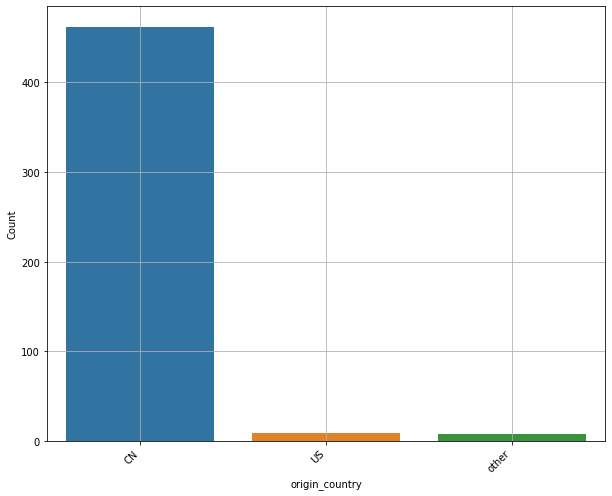

In [41]:
#create function to replace some of origin_country with keyword 'other'
def handle_origin_country(cName):
    if cName == 'CN' \
    or cName == 'US':
        return cName
    else:
        return "other"

#apply the function on the column to replace the values
dft['origin_country'] = dft['origin_country'].apply(handle_origin_country)

# checking for distribution of origin_country after handling
fig, ax = plt.subplots(figsize = (10, 8))
sns.countplot('origin_country', data = dft, order = dft['origin_country'].value_counts().index, ax = ax)
ax.set(xlabel='origin_country', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the product_variation_size_id feature

# **Handling the product_variation_size_id column by replace the values which has the same concept but written down in wrong value by the basic one for them and the values with low rows pr doesn't know with keyword 'other'**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


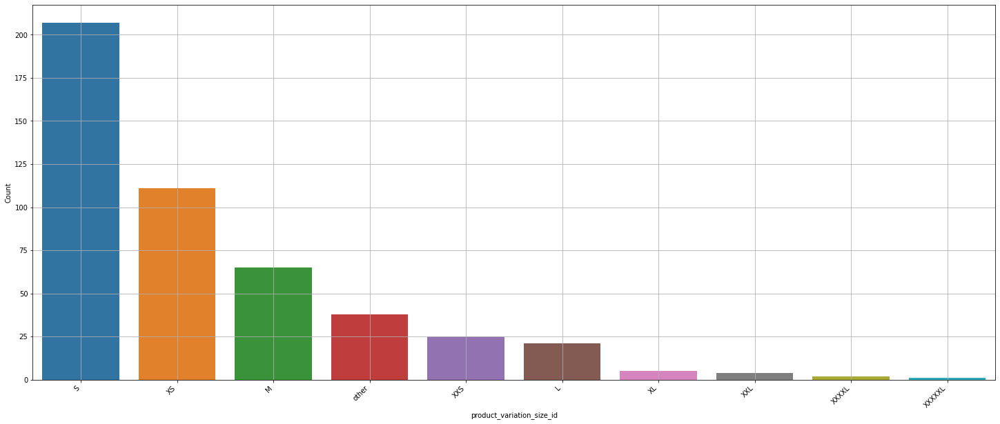

In [42]:
#replace some values have the same concept with the basic one for them
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['S.','Size S','Size-S', 'Size S.','S..','Size/S','SIZE S', 's', 'size S'], 'S')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['X   L','1 PC - XL'], 'XL')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['Size-XXS','SIZE XXS','Size -XXS','SIZE-XXS', 'Size XXS'], 'XXS')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['XS.','Size-XS','SIZE XS'], 'XS')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['S/M(child)','M.','Size M'], 'M')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace('SizeL', 'L')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace('6XL', 'XXXXXXL')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['Size-5XL','5XL'], 'XXXXXL')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace(['04-3XL','4XL','Size4XL'], 'XXXXL')
dft['product_variation_size_id'] = dft['product_variation_size_id'].replace('2XL ', 'XXL')

#create function to replace other size didn't select in upper term with keyword 'other'
def pr_var_id(name):
    if name == 'S' \
    or name == 'XL' \
    or name == 'XXS' \
    or name == 'XS' \
    or name == 'M' \
    or name == 'L' \
    or name == 'XXXXXXL' \
    or name == 'XXXXXL' \
    or name == 'XXXXL'\
    or name == 'XXL':
        return name
    else:
        return "other"


#apply the function on the column to replace the values
dft['product_variation_size_id'] = dft['product_variation_size_id'].apply(pr_var_id)

# checking for distribution of product_variation_size_id after handling
fig, ax = plt.subplots(figsize = (25, 10))
sns.countplot('product_variation_size_id', data = dft, order = dft['product_variation_size_id'].value_counts().index, ax = ax)
ax.set(xlabel='product_variation_size_id', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the units_sold feature

# **Handling the units_sold column by replace the values which has value less than 10 to be 10  and let the other has the same values**

**to be look like the training data**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


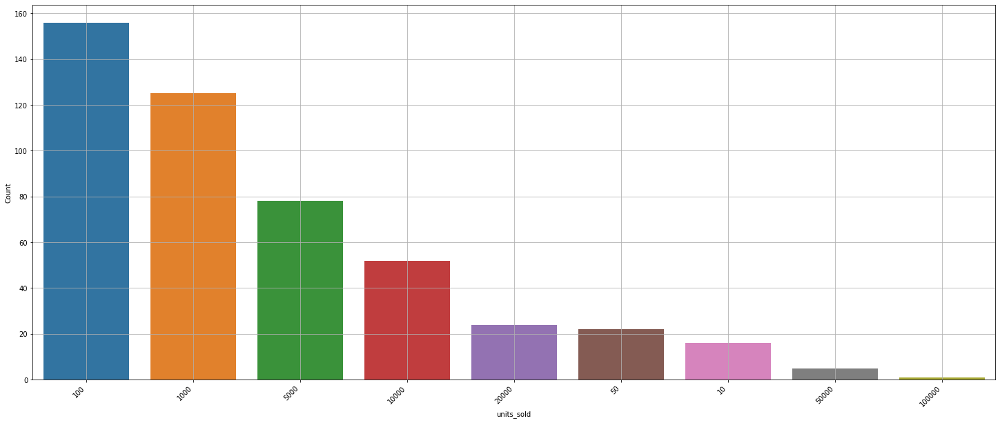

In [43]:
# checking for distribution of units sold 
df['units_sold'].value_counts()

# we have some units less than 10 so we're going to group them
def below_ten(units_sold):
    if units_sold < 10:
        return 10
    else:
        return units_sold

#apply the function on the column to replace the values
dft['units_sold'] = dft['units_sold'].apply(below_ten)

# checking for distribution of units sold to see if it correctly categorized everything
fig_dims = (25, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot('units_sold', data = dft, order = dft['units_sold'].value_counts().index, ax = ax)
ax.set(xlabel='units_sold', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#handling the has_urgency_banner feature

**Handling has_urgency_banner column by fill all null values by '0' because if has urgency banner it's equal '1' so if hasn't urgency banner it will be '0'**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


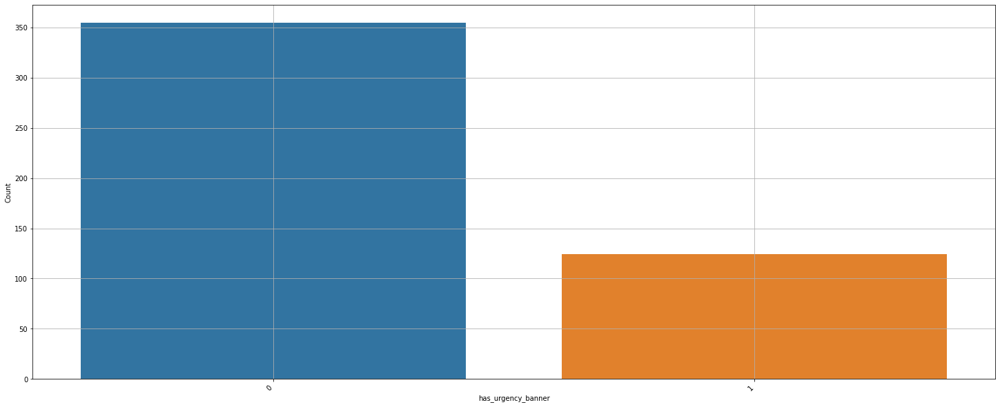

In [44]:
#fill nan values with 0
dft['has_urgency_banner'].fillna(0, inplace=True)

#convert type of the column to be integer
dft.has_urgency_banner = dft.has_urgency_banner.astype(int)

# checking for distribution of has_urgency_banner column after handling
fig_dims = (25, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot('has_urgency_banner', data = dft, order = dft['has_urgency_banner'].value_counts().index, ax = ax)
ax.set(xlabel='has_urgency_banner', ylabel='Count')
plt.xticks(rotation=45, ha='right')
plt.grid()
plt.show()

#**Drop Features**

**Drop the same features which i droped them in the training data**

In [45]:
#save the id columne before i drop it because i will use it in the file which i will submit in kaggle 
_id = dft['id']
dft.drop(['currency_buyer', 'theme','crawl_month', 'shipping_option_name','inventory_total','merchant_name','merchant_title','merchant_info_subtitle','id','merchant_profile_picture','urgency_text','countries_shipped_to','merchant_id','shipping_is_express','badge_local_product', 'tags'], axis=1, inplace=True)

#This For One Hot Encoding

In [46]:
#one Hot Encoding the categorical data and handle the data frame of test to have the same number of features to be look like the training data to be easy on the model to make prediction
one_hot_2 = pd.get_dummies(dft ,columns = ['origin_country','product_variation_size_id','product_color'] )
final_train , final_test = one_hot.align(one_hot_2, join='left', axis=1)
final_test

,price,retail_price,units_sold,uses_ad_boosts,rating_count,badges_count,badge_product_quality,badge_fast_shipping,product_variation_inventory,shipping_option_price,has_urgency_banner,merchant_rating_count,merchant_rating,merchant_has_profile_picture,origin_country_CN,origin_country_US,origin_country_other,product_variation_size_id_L,product_variation_size_id_M,product_variation_size_id_S,product_variation_size_id_XL,product_variation_size_id_XS,product_variation_size_id_XXL,product_variation_size_id_XXS,product_variation_size_id_XXXXL,product_variation_size_id_XXXXXL,product_variation_size_id_XXXXXXL,product_variation_size_id_other,product_color_armygreen,product_color_black,product_color_blue,product_color_brown,product_color_green,product_color_grey,product_color_ivory,product_color_orange,product_color_other,product_color_pink,product_color_rainbow,product_color_red,product_color_white,product_color_white & black,product_color_yellow
0,5.75,5,10,1,0,0,0,0,5,2,0,3,2.333333,0,1,0,0,0,0,0,0,1,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,0
1,7.00,7,5000,0,579,0,0,0,50,2,0,4213,4.058391,0,1,0,0,0,0,0,0,1,0,0,0,0,NaN,0,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,0
2,5.00,16,1000,1,62,0,0,0,20,2,0,10501,4.029235,0,1,0,0,0,0,0,0,1,0,0,0,0,NaN,0,0,0,1,0,0,0,0,0,0,0,0,0,0,NaN,0
3,18.00,27,5000,1,1903,0,0,0,50,5,0,15855,4.052917,0,1,0,0,0,1,0,0,0,0,0,0,0,NaN,0,0,0,1,0,0,0,0,0,0,0,0,0,0,NaN,0
4,12.00,81,20000,0,1799,0,0,0,50,3,0,151914,4.127921,0,1,0,0,0,1,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,16.00,14,100,1,27,0,0,0,50,4,0,572,3.367133,0,0,0,1,0,1,0,0,0,0,0,0,0,NaN,0,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,0
475,6.00,17,5000,1,817,0,0,0,1,2,0,50864,4.079644,1,1,0,0,0,0,0,0,0,0,1,0,0,NaN,0,0,0,1,0,0,0,0,0,0,0,0,0,0,NaN,0
476,4.83,51,50,1,1,0,0,0,3,1,1,57,3.824561,0,0,0,1,0,0,0,0,1,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,0
477,3.00,3,100,1,8,0,0,0,3,1,1,1086,4.056169,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,1,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,0


In [47]:
#convert all data type of features to float
final_test = final_test.astype(float, copy=True, errors='raise')
print(final_test.info())
#fill the null cells with unknown value (-1)
final_test = final_test.fillna(-1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   price                              479 non-null    float64
 1   retail_price                       479 non-null    float64
 2   units_sold                         479 non-null    float64
 3   uses_ad_boosts                     479 non-null    float64
 4   rating_count                       479 non-null    float64
 5   badges_count                       479 non-null    float64
 6   badge_product_quality              479 non-null    float64
 7   badge_fast_shipping                479 non-null    float64
 8   product_variation_inventory        479 non-null    float64
 9   shipping_option_price              479 non-null    float64
 10  has_urgency_banner                 479 non-null    float64
 11  merchant_rating_count              479 non-null    float64

#This For Categorical Encoding

In [48]:
#apply the function which convert the categorical data into numircal data
dft[categorical_cols] = dft[categorical_cols].apply(lambda col: col.map(dict_categorical[col.name]))
#fill the null cells with unknown value (-1)
dft = dft.fillna(-1)
dft

,price,retail_price,units_sold,uses_ad_boosts,rating_count,badges_count,badge_product_quality,badge_fast_shipping,product_color,product_variation_size_id,product_variation_inventory,shipping_option_price,has_urgency_banner,origin_country,merchant_rating_count,merchant_rating,merchant_has_profile_picture
0,5.75,5,10,1,0,0,0,0,12,4,5,2,0,0,3,2.333333,0
1,7.00,7,5000,0,579,0,0,0,1,4,50,2,0,0,4213,4.058391,0
2,5.00,16,1000,1,62,0,0,0,2,4,20,2,0,0,10501,4.029235,0
3,18.00,27,5000,1,1903,0,0,0,2,1,50,5,0,0,15855,4.052917,0
4,12.00,81,20000,0,1799,0,0,0,12,1,50,3,0,0,151914,4.127921,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,16.00,14,100,1,27,0,0,0,1,1,50,4,0,2,572,3.367133,0
475,6.00,17,5000,1,817,0,0,0,2,6,1,2,0,0,50864,4.079644,1
476,4.83,51,50,1,1,0,0,0,12,4,3,1,1,2,57,3.824561,0
477,3.00,3,100,1,8,0,0,0,1,10,3,1,1,0,1086,4.056169,0


## after finishing data preprocessing and cleaning


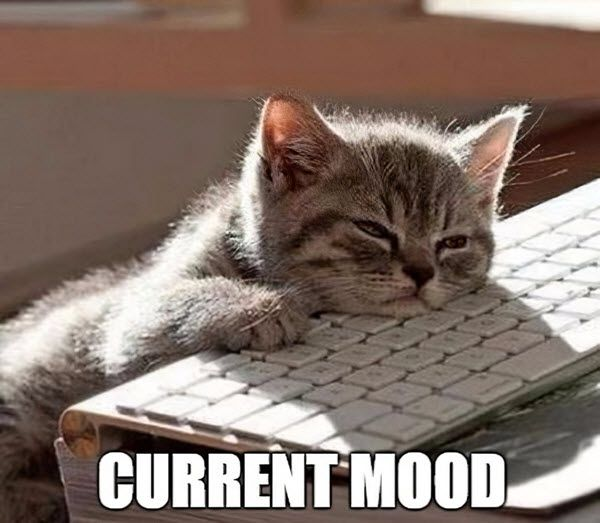

# **Create Models**

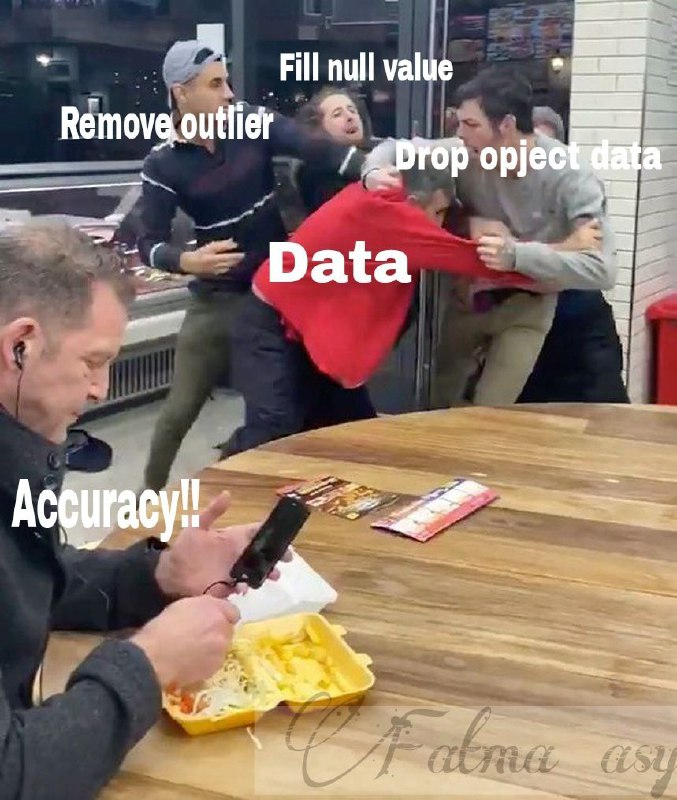

## **Decision Tree Models**

#Trail 1

### using the Data with one hot encoding to train the decision tree model with hyperparameter ('gini', max_depth = '7', min_sample_leaf = 2

In [49]:
#train the model with selected hyperparameters
D_Tree_h_g = DecisionTreeClassifier(criterion= "gini", max_depth= 7 , min_samples_leaf= 2 , random_state=42)
D_Tree_h_g.fit(xTrain , yTrain)

#test the accuracy of model on training set
print('D_Tree Train Score is : ' , D_Tree_h_g.score(xTrain, yTrain))

#calculate the f1-score on 10% of training data which is the test data
y_pred_DTC = D_Tree_h_g.predict(xTest)
f1_scores_DTC=f1_score(yTest, y_pred_DTC, average='micro')
print('F1-Score is : ', f1_scores_DTC)


D_Tree Train Score is :  0.834349593495935
F1-Score is :  0.7727272727272727


as we see we got


*   **83.4%** score from training 
*   **77.2%** as f1-score from test data
*   **0.80334** f1-score on kaggle competition
on test data from this model

---



**Visualizing the Decision Tree**

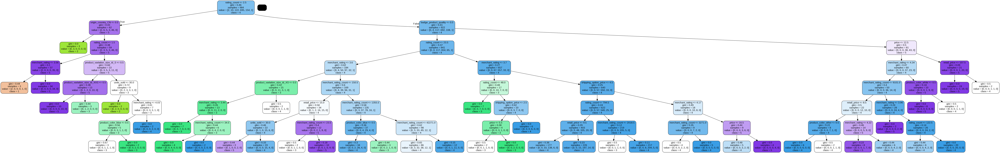

In [50]:
#Visualizing the Decision Tree
dot_data = StringIO()
feature_cols = X_h.columns
export_graphviz(D_Tree_h_g, out_file= dot_data, feature_names = feature_cols, class_names = ["1", "2", '3', '4', '5'], rounded = True, proportion = False, precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Decision Tree.png")
Image(graph.create_png())

**Calculating Confusion Matrix**

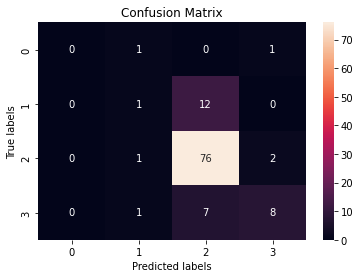

In [51]:
#Calculating Confusion Matrix
CM = confusion_matrix(yTest, y_pred_DTC)

# drawing confusion matrix
ax= plt.subplot()
sns.heatmap(CM, annot=True, fmt='g', ax = ax);
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 

**create a prediction file from test file**

In [52]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_h_g model
pred_test = D_Tree_h_g.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_77.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,1.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


#Trail 2

# using the Data with one hot encoding to train the decision tree model with hyperparameter ('entropy', max_depth = '7', min_sample_leaf = 2

In [53]:
#train the model with optimal hyperparameters
D_Tree_h_e = DecisionTreeClassifier(criterion= "entropy", max_depth= 7 , min_samples_leaf= 2 , random_state=42)
D_Tree_h_e.fit(xTrain , yTrain)

#test the accuracy of model on training set
print('D_Tree Train Score is : ' , D_Tree_h_e.score(xTrain, yTrain))

#calculate the f1-score on 10% of training data which is the test data
y_pred_DTC_e = D_Tree_h_e.predict(xTest)
f1_scores_DTC_e = f1_score(yTest, y_pred_DTC_e, average='micro')
print('F1-Score is : ', f1_scores_DTC_e)


D_Tree Train Score is :  0.8323170731707317
F1-Score is :  0.7909090909090909


as we see we got


*   **83.2%** score from training 
*   **79%** as f1-score from test data
*   **0.79916** f1-score on kaggle competition 

on test data from this model

---



**Visualizing the Decision Tree**

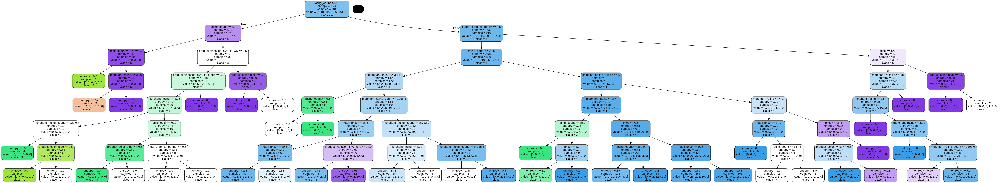

In [54]:
#Visualizing the Decision Tree
dot_data = StringIO()
feature_cols = X_h.columns
export_graphviz(D_Tree_h_e, out_file= dot_data, feature_names = feature_cols, class_names = ["1", "2", '3', '4', '5'], rounded = True, proportion = False, precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Decision Tree.png")
Image(graph.create_png())

**Calculating Confusion Matrix**

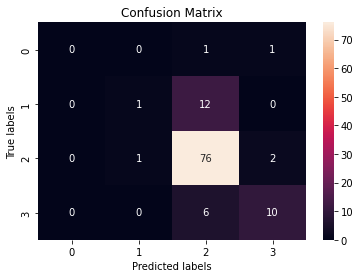

In [55]:
#Calculating Confusion Matrix
CM = confusion_matrix(yTest, y_pred_DTC_e)

# drawing confusion matrix
ax= plt.subplot()
sns.heatmap(CM, annot=True, fmt='g', ax = ax);
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 

**create a prediction file from test file**

In [56]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_h_e model
pred_test = D_Tree_h_e.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_79.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,1.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


#Trail 3

# using the Data with encoding the categorical data to train the decision tree model with hyperparameter ('gini', max_depth = '7', min_sample_leaf = 2

In [57]:
#train the model with optimal hyperparameters
D_Tree_c_g = DecisionTreeClassifier(criterion= "gini", max_depth= 7 , min_samples_leaf= 2 , random_state=42)
D_Tree_c_g.fit(xTrain_c , yTrain_c)

#test the accuracy of model on training set
print('D_Tree Train Score is : ' , D_Tree_c_g.score(xTrain_c, yTrain_c))

#calculate the f1-score on 10% of training data which is the test data
y_pred_DTC_c = D_Tree_c_g.predict(xTest_c)
f1_scores_DTC_c = f1_score(yTest_c, y_pred_DTC_c, average='micro')
print('F1-Score is : ', f1_scores_DTC_c)


D_Tree Train Score is :  0.8323170731707317
F1-Score is :  0.7818181818181819


as we see we got


*   **83.2%** score from training 
*   **78.1%** as f1-score from test data
*   **0.80753** f1-score on kaggle competition

on test data from this model

---



**Visualizing the Decision Tree**

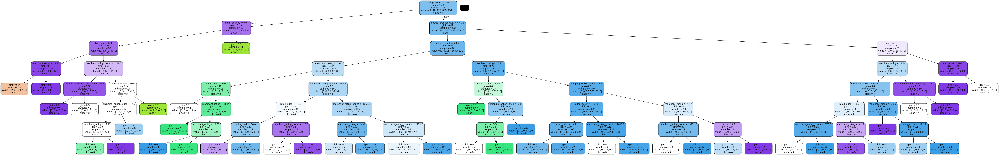

In [58]:
#Visualizing the Decision Tree
dot_data = StringIO()
feature_cols = X_C.columns
export_graphviz(D_Tree_c_g, out_file= dot_data, feature_names = feature_cols, class_names = ["1", "2", '3', '4', '5'], rounded = True, proportion = False, precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Decision Tree.png")
Image(graph.create_png())

**Calculating Confusion Matrix**

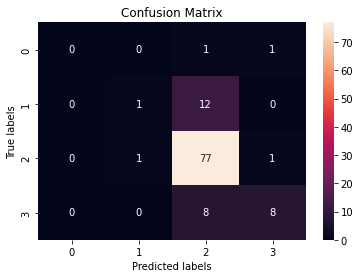

In [59]:
#Calculating Confusion Matrix
CM = confusion_matrix(yTest, y_pred_DTC_c)

# drawing confusion matrix
ax= plt.subplot()
sns.heatmap(CM, annot=True, fmt='g', ax = ax);
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 

**create a prediction file from test file**

In [60]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_g model
pred_test = D_Tree_c_g.predict(dft)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_78.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,1.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


#Trail 4

# using the Data with encoding the categorical data to train the decision tree model with hyperparameter ('entropy', max_depth = '7', min_sample_leaf = 2

In [61]:
#train the model with optimal hyperparameters
D_Tree_c_e = DecisionTreeClassifier(criterion= "entropy", max_depth= 6 , min_samples_leaf= 2 , random_state=42)
D_Tree_c_e.fit(xTrain_c , yTrain_c)

#test the accuracy of model on training set
print('D_Tree Train Score is : ' , D_Tree_c_e.score(xTrain_c, yTrain_c))

#calculate the f1-score on 10% of training data which is the test data
y_pred_DTC_c_2 = D_Tree_c_e.predict(xTest_c)
f1_scores_DTC_c = f1_score(yTest_c, y_pred_DTC_c_2, average='micro')
print('F1-Score is : ', f1_scores_DTC_c)


D_Tree Train Score is :  0.8201219512195121
F1-Score is :  0.7727272727272727


as we see we got


*   **82%** score from training 
*   **77.2%** as f1-score from test data
*   **0.79916** f1-score on kaggle competition

on test data from this model

---



**Visualizing the Decision Tree**

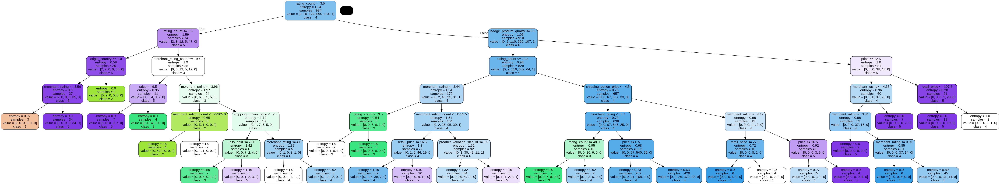

In [62]:
#Visualizing the Decision Tree
dot_data = StringIO()
feature_cols = X_C.columns
export_graphviz(D_Tree_c_e, out_file= dot_data, feature_names = feature_cols, class_names = ["1", "2", '3', '4', '5'], rounded = True, proportion = False, precision = 2, filled = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Decision Tree.png")
Image(graph.create_png())

**Calculating Confusion Matrix**

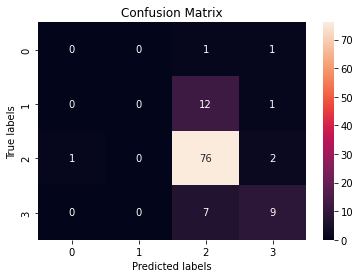

In [63]:
#Calculating Confusion Matrix
CM = confusion_matrix(yTest, y_pred_DTC_c_2)

# drawing confusion matrix
ax= plt.subplot()
sns.heatmap(CM, annot=True, fmt='g', ax = ax);
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 

**create a prediction file from test file**

In [64]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = D_Tree_c_e.predict(dft)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_77.2.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,1.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


**so from all of the above of these models the best two models are**


*   **D_Tree_c_g**
*   **D_Tree_h_e**

#Random Forest Model

## here i want to test the random forest to see if the results will improve or not

#Trail 1

Using Random Forest with Cross Validation by using data with categorical encoding

In [65]:
# Random forest CROSS VALIDATED with 10 KFolds
RFC_c = RandomForestClassifier(random_state=3)
kfold = KFold(n_splits=10)
y_pred_RFC_c = cross_val_predict(RFC_c, X_C, Y, cv=kfold) #Cross validation on training set

f1_scores_RFC=f1_score(Y, y_pred_RFC_c, average='micro')
print(f1_scores_RFC)

## Random forest without Cross VALIDATED
RFC_c.fit(xTrain_c, yTrain_c)
pred_c = RFC_c.predict(xTest_c)
f1_scores_RF = f1_score(yTest_c, pred_c, average='micro')
print(f1_scores_RF)
#mean(f1_scores_RFC)

0.8025594149908593
0.8090909090909091


as we see we got


*   **80.2%** f1-score from cross validation
*   **80.9%** as f1-score from test data without cross validation
*   **0.81589** f1-score on kaggle competition

on test data from this model

---
****this is the best on as f1-score****

---




In [66]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = RFC_c.predict(dft)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_r.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,5.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


#Trail 2

Using Random Forest with Cross Validation by using data with one hot encoding

In [67]:
# Random forest CROSS VALIDATED with 10 KFolds
RFC_h = RandomForestClassifier(random_state=23)
kfold = KFold(n_splits=10)
y_pred_RFC_h = cross_val_predict(RFC_h, X_h, Y, cv=kfold) #Cross validation on training set

f1_scores_RFC_h = f1_score(Y, y_pred_RFC_h, average='micro')
print(f1_scores_RFC)

## Random forest without Cross VALIDATED
RFC_h.fit(xTrain, yTrain)
pred_h = RFC_h.predict(xTest)
f1_scores_RF = f1_score(yTest, pred_h, average='micro')
print(f1_scores_RF)

0.8025594149908593
0.8000000000000002


as we see we got


*   **80.25%** f1-score from cross validation
*   **80%** as f1-score from test data without cross validation
*   **0.80334** f1-score on kaggle competition

on test data from this model

---



In [68]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = RFC_h.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_r2.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,5.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


# **SVM Models**

# ***Trail One***

in the beginning i want to use SVM model with **Linear Kernal** so i will normalize the data to fit the model in short time, because if i didn't normalize the data before fit the model that take from me long time to run (around one day) so the first step is normalization

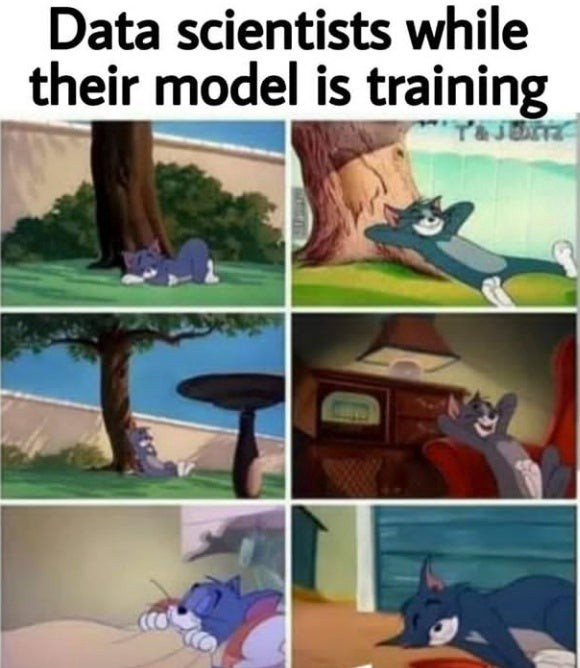

In [69]:
#normalize the data values X_one_hot_encoding
scaler = StandardScaler()
X_n = scaler.fit_transform(X_h)
xTrain_n = scaler.transform(xTrain)
xTest_n = scaler.transform(xTest)
X_n

array([[-0.0796864 , -0.52573302,  0.55811387, ..., -0.43934123,
        -0.07426107,  3.82473155],
       [-0.0796864 , -0.52573302, -0.35828097, ..., -0.43934123,
        -0.07426107, -0.26145626],
       [-0.57650589,  0.32364082, -0.44992045, ...,  2.27613509,
        -0.07426107, -0.26145626],
       ...,
       [ 0.16872335,  0.76405689, -0.35828097, ..., -0.43934123,
        -0.07426107, -0.26145626],
       [ 0.66554285, -0.43135815,  0.55811387, ..., -0.43934123,
        -0.07426107, -0.26145626],
       [-0.32809615, -0.55719132, -0.35828097, ..., -0.43934123,
        -0.07426107,  3.82473155]])

#Trail 1

the first SVM model with hyperparameters (kernel = 'linear', C=10 , gamma=0.01 , probability=True) 
in this model i expect to give me score on the trainning data above 85%
and the score on the testing data around 77%

In [70]:
#train the model with optimal hyperparameters
SVM_model_c = SVC(kernel = 'linear', C=10 , gamma=0.01 , random_state = 42 , probability=True)
SVM_model_c.fit(xTrain_n, yTrain)
#test the accuracy of model on training set
print('SVM_model Train Score is : ' , SVM_model_c.score(xTrain_n, yTrain))

SVM_model Train Score is :  0.7296747967479674


In [71]:
yPred_c_n = SVM_model_c.predict(xTest_n)
print(yPred_c_n)

[4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 5. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 5. 5. 4. 4. 4. 4. 4. 4.
 5. 4. 4. 4. 5. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 4.
 4. 4. 4. 4. 4. 4. 4. 5. 5. 4. 4. 4. 4. 4.]


In [72]:
ClassificationReport = classification_report(yTest_c, yPred_c_n, zero_division = True)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

         2.0       1.00      0.00      0.00         2
         3.0       1.00      0.00      0.00        13
         4.0       0.75      0.95      0.84        79
         5.0       0.60      0.38      0.46        16

    accuracy                           0.74       110
   macro avg       0.84      0.33      0.32       110
weighted avg       0.76      0.74      0.67       110



as we see this model given me numbers less than what i expected it's given me 72.9% score on the training data and 74 score on test data

as we see we got


*   **72.9%** score from training 
*   **74%** as f1-score from test data
*   **0.29288** f1-score on kaggle competition
on test data from this model

which is very bad it's the worst one i used until now

---



In [73]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = SVM_model_c.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_SVM_1.csv', index=False)
pred_test
pred_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but SVC was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


,id,rating
0,937,4.0
1,270,4.0
2,308,2.0
3,913,4.0
4,403,2.0


## So i will try another model with another hyperparameters 

the second SVM model
Train the model with train data which use one Hot Encoding and without normalization with hyperparameter (kernel = 'rbf', C=10 , gamma=0.1,  probability=True)
in this model i expect to improve the result to be better than the first SVM model

# ***Trail Two***

In [74]:
#train the model with optimal hyperparameters
SVM_model = SVC(kernel = 'rbf', C=10 , gamma=0.1 , random_state = 42 , probability=True)
SVM_model.fit(xTrain, yTrain)

#test the accuracy of model on training set
print('SVM_model Train Score is : ' , SVM_model.score(xTrain, yTrain))

SVM_model Train Score is :  0.9979674796747967


In [75]:
#use the test data which taken from the training data to test the model
yPred = SVM_model.predict(xTest)
print(yPred)

[4. 4. 4. 4. 4. 4. 2. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 5. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 3. 4. 4. 5. 5. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.]


In [76]:
#print all scores and results for prediction part
#print a report for the prediction data
ClassificationReport = classification_report(yTest, yPred, zero_division = True)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

         2.0       1.00      0.50      0.67         2
         3.0       1.00      0.08      0.14        13
         4.0       0.76      1.00      0.86        79
         5.0       1.00      0.25      0.40        16

    accuracy                           0.77       110
   macro avg       0.94      0.46      0.52       110
weighted avg       0.83      0.77      0.71       110



as we see the model is improved which give me 

*   99.7% score on the trainning data which it was learning from the data by 99.7% which is good
*   77% score for test data which is better than the first SVM model but still nod enough



as we see we got


*   **99.7%** score from training 
*   **77%** as f1-score from test data
*   **0.78242** f1-score on kaggle competition
on test data from this model

**which is better than the trail 1**

---



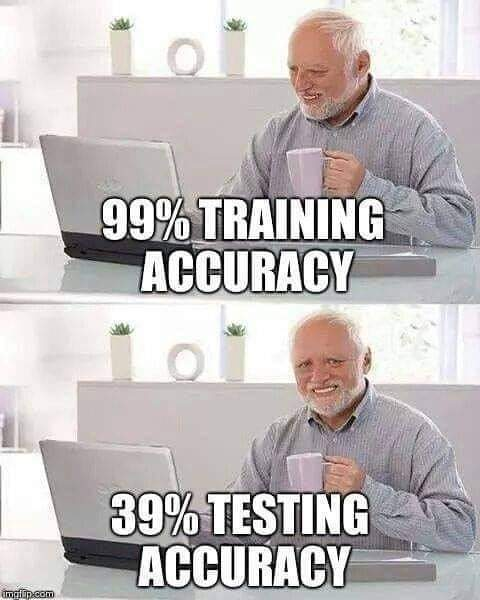

In [77]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = SVM_model.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_SVM_2.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,4.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0




---




# ***Naive Bayesian***

in this model i expect to give me the worst results in all models i built because this model need a huge data to learn well so i used 

*   GaussianNB model from Naive Bayesian models with hyperparameters (priors=None, var_smoothing=0.9)

*   my expectations are give me score on the training data around 70% and around 60% on test data





In [78]:
G_model = GaussianNB(priors=None, var_smoothing=0.9)
G_model.fit(xTrain,yTrain)
y_Pred = G_model.predict(xTest)
#test the accuracy of model on training set
print('GaussianNB Model Train Score is : ' , G_model.score(xTrain, yTrain), '\n')

#calculate F1-Score for the Gaussian Model
f1_scores_RF = f1_score(yTest, y_Pred, average='micro')
print("F1-Score", f1_scores_RF, '\n')

#print a report for the prediction data
ClassificationReport = classification_report(yTest, y_Pred, zero_division = True)
print('Classification Report is : \n', ClassificationReport, '\n')

GaussianNB Model Train Score is :  0.7012195121951219 

F1-Score 0.7181818181818181 

Classification Report is : 
               precision    recall  f1-score   support

         2.0       1.00      0.00      0.00         2
         3.0       1.00      0.00      0.00        13
         4.0       0.72      1.00      0.84        79
         5.0       1.00      0.00      0.00        16

    accuracy                           0.72       110
   macro avg       0.93      0.25      0.21       110
weighted avg       0.80      0.72      0.60       110
 



as we see the model was given me score on training data 70.1% as i expected and score on test around 72% which is more than what i expected

as we see we got


*   **70.1%** score from training 
*   **71%** as f1-score from test data
*   **0.75732** f1-score on kaggle competition
on test data from this model

**which is so so**

---



In [79]:
#create file from pridiction of the test_new.csv file to submit on kaggle for D_Tree_c_e model
pred_test = G_model.predict(final_test)
pred_df = pd.DataFrame(data={'id': np.asarray(_id), 'rating': pred_test})
pred_df.to_csv('pred_res_Gau.csv', index=False)
pred_test
pred_df.head()

,id,rating
0,937,4.0
1,270,4.0
2,308,4.0
3,913,4.0
4,403,4.0


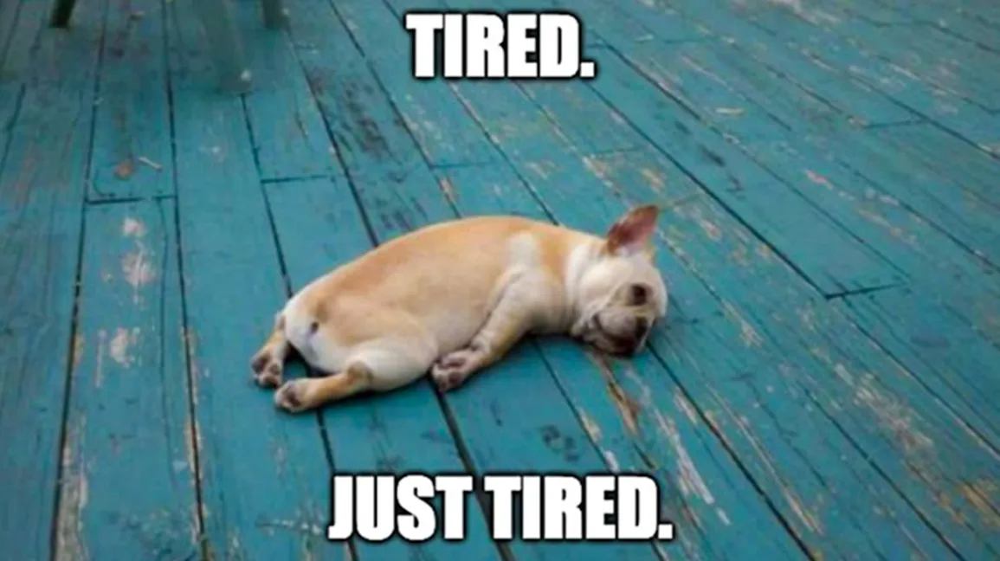

#Define the problem

* The dataset is the wish.com product dataset
* the dataset has alot of noise and missing values and a lot of things need to data preprocessing
* **the problem is**
* i have some features for the product and i need to predict the product rating to help Wish.com to know if this priduct will be good for people or not to publish the product on the website or not 

---

* The goal is to predict product ratings based on other information available about a product on Wish.com. The rating range from 1 to 5. The higher the rating for a product, the more satisfied for the customers. When you have a new product to list on wish.com, you may use this model to predict how probable people will like it before actually listing it. Also , by doing so, we may better determine under what circumstances a product will be highly rated, as well as the wish.com consumer base.



# What is the input?

the input is the features of the product to predict the rating value but the model will select this features from the data input
* price                           
* retail_price                    
* units_sold                      
* uses_ad_boosts                  
* rating                          
* rating_count                    
* badges_count                    
* badge_product_quality           
* badge_fast_shipping             
* product_color                   
* product_variation_size_id       
* product_variation_inventory     
* shipping_option_price           
* has_urgency_banner              
* origin_country                  
* merchant_rating_count           
* merchant_rating                
* merchant_has_profile_picture

# What is the output?

the out put is the prediction rating for the input product

#What data mining function is required?

i will use this model to find the pattern i will use to predict the rating of the product

---
the data mining function i used are
* load the data
* clean the data
* drop columns which has unique value
* fill the null values
* drop columns that not important in the training model
* handle the columns which has Inconsistent Data Entry 
* convert the categorical data to numirical data


#What could be the challenges? 

the callenges was how to find the problems in the data and how to deal with this problems like 
* how to deal with unique values
* how to deal with Inconsistent Data Entry
* how to deal with the not important features
* how to deal with categorical data
* how to deal with nan values

for the models was there many challenges like
* how to chose the optimal hyperparameters
* how to improve the performance of the models
* how to find the best f1-score

#What is the impact?

it will help the companies to check if the product will be good or not for the customers by predict the rating of the product before launch the product so they will predict the rating and predict if this product will make them earn much money or not to publish this product or not

#What is an ideal solution?

the ideal solution is the Random Forest model with categorical encoding(RFC_c model)
which has
*   **80.25%** f1-score from cross validation
*   **80%** as f1-score from test data without cross validation
*   **0.80334** f1-score on kaggle competition

#What is the experimental protocol used and how was it carried out?

in the beginning i used very simple model with all data without preprocessing and i got 10% f1-score on kaggle \
then i start in data preprocessing like i did in this notebook like \

* drop columns which has unique values 
* drop columns which not important in the training model
* fill nan values by using fill forward method
* convert the catigorical data to numirical data
by applay one hot encoding first time and then by using categorical encoding
* convert all data type to float
* handling some features which have Inconsistent Data Entry
* handling feature which has bad distribution for data like unit-sold feature

about the model i just used a lot of approaches like GridesearchCV then i removed this approache then i did a lot of tryies of hyperparameters for each model with different types of data like 
* data with one hot encoding 
* data with categorical encoding 

#What preprocessing steps are used?

in the beginning i used very simple model with all data without preprocessing and i got 10% f1-score on kaggle \
then i start in data preprocessing like i did in this notebook like \

* drop columns which has unique values 
* drop columns which not important in the training model
* fill nan values by using fill forward method
* convert the catigorical data to numirical data
by applay one hot encoding first time and then by using categorical encoding
* convert all data type to float
* handling some features which have Inconsistent Data Entry
* handling feature which has bad distribution for data like unit-sold feature


---


#Answer the questions below (briefly):

##Why Data Mining is a misnomer? What is another preferred name?

###Why Data Mining is a misnomer? \
because we aren't mining for the data but we are mining from the data, it's not look like bitcoin mining, it's look like mining for the knowledge \
###What is another preferred names? \
 * **knowledge descovry from the data(KDD)**
 * knowledge extraction
 * data/pattern analysis
 * data archeology
 * data dredging
 * information harvesting
 * business intelligence

##What is the general knowledge discovery process? What is the difference between a data engineer and data scientist/AI engineer?

###What is the general knowledge discovery process?

1. **Data cleaning:** is the process of removing noisy and useless data from a collection.

2. **Data Integration:** Data integration is the process of combining heterogeneous data from various sources into a single source (DataWarehouse).

3. **Data Selection:** Data selection is described as the process of deciding and retrieving data from the data collection that is important to the analysis. 

4. **Data Transformation:** is described as the process of changing data into the proper form required by the mining technique.

5. **Data mining:** is described as the application of smart techniques to extract potentially relevant patterns.

6. **Pattern Evaluation:** is described as the process of detecting strictly increasing patterns that represent knowledge based on predetermined measures.

7. **Knowledge representation:** is a strategy for representing data mining results that involves the use of visualisation tools. \
---

###What is the difference between a data engineer and data scientist/AI engineer?

* **Data engineers:** are data specialists who help data scientists analyse large amounts of data by providing infrastructure.
* **Data scientist:** A data scientist's duty is to convert raw data into intelligence and information, and they use statistics, machine learning, and analytic approaches to solve scientific problems.

##what is the difference between prediction and categorization?

* **Categorization:** is the process of predicting the class of things for which the class label is unknown. In simple terms, we can state that we categorise incoming new data based on our current or previous assumptions, as well as the data we already have, the output is a discrete value. \

* **prediction:**  is like something that may go to happen in the future. , we identify or predict the missing or unavailable data for a new observation based on the previous data that we have and based on the future assumptions. In prediction, the output is a continuous value.


##Why data science/machine learning is a bad idea in the context of information security?



because it increase uncertainty, increase risk of data breach, fine difficult to evaluate change in AI and difficult to verify against compliance. 

and because of this risks \ 

* **Backdoor attack:** Disrupt the system's integrity.
* **Adversarial sample:** An adversarial example is one in which a machine learning model makes an incorrect prediction due to small, purposeful feature changes.
* Information Leak: When information from outside the training dataset is used to generate the model, this is known as data leakage. This new data can allow the model to learn or know something it wouldn't have known otherwise, invalidating the estimated performance of the mode being built.

##What is CIA principle and how can we use it to access the security/privacy aspect of the AI system/pipelines?

**CIA** is stand for confidentiality, integrity, and availability These three concepts are critical to every organization's security infrastructure, and they should be the goals and objectives of every security programme.
also known as the CIA triad,\

**confidentiality :** is a set of rules that limits access to information. \

**integrity:** The guarantee that the information is reliable and correct.\

**availability:** refers to the assurance that authorized users will have dependable access to information.

**Confidentiality (privacy) attacks** aim to acquire and extract an important and sensitive information from your AI system. 

**Integrity attacks** aim to make your AI model to make a mistakes so quietly. 

**Availability attacks** try to completely disable your AI system.


If you can protect your AI model from all these three threats 
you will get a security covered.




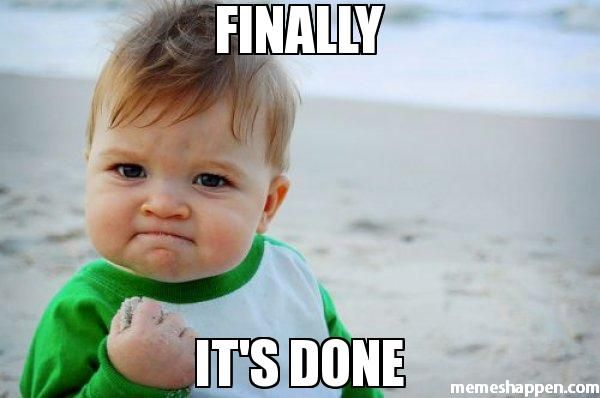